#  Analyse exploratoire des transactions bancaires (fraude)

Ce notebook réalise une **analyse exploratoire des données (EDA)** du jeu de données `creditcard.csv`, contenant des transactions bancaires normales et frauduleuses.

##  Objectifs

- Comprendre la structure du jeu de données (taille, variables, types).
- Étudier la répartition des classes (fraude vs non-fraude).
- Analyser la distribution des variables **Time** et **Amount**.
- Mettre en évidence le déséquilibre de la classe *fraude*.
- Explorer les relations entre variables (corrélations).
- Identifier les variables les plus pertinentes pour la détection de fraude.


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style="whitegrid")


#  Analyse exploratoire des transactions bancaires (fraude)

##  Importation des bibliothèques

Nous importons ici les librairies essentielles pour l’analyse :
- **pandas** pour manipuler les données  
- **numpy** pour certains calculs  
- **seaborn** et **matplotlib** pour les visualisations  

Le style graphique est configuré avec *whitegrid* pour améliorer la lisibilité.


In [ ]:
# Charger le dataset depuis le dossier data
df = pd.read_csv("./data/creditcard_sample.csv")


# Afficher les premières lignes pour vérifier que tout fonctionne
df.head()


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


## Chargement du dataset

Nous chargeons le fichier `creditcard.csv` depuis le dossier **data**.  
La fonction `head()` permet de vérifier que les données ont bien été importées.


In [252]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

## Informations générales sur le dataset

Cette commande permet d’obtenir :
- le nombre total de lignes et colonnes,
- le type de chaque variable,
- la présence éventuelle de valeurs manquantes,
- la mémoire utilisée.

Cela donne un aperçu global de la structure du dataset.


In [253]:
df.describe()


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.175161e-15,3.384974e-16,-1.379537e-15,2.094852e-15,1.021879e-15,1.494498e-15,-5.620335e-16,1.149614e-16,-2.414189e-15,...,1.628620e-16,-3.576577e-16,2.618565e-16,4.473914e-15,5.109395e-16,1.686100e-15,-3.661401e-16,-1.227452e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


##  Statistiques descriptives

Cette table montre les principales statistiques des variables numériques :
- moyenne,
- médiane,
- quartiles,
- valeurs minimales et maximales.

Elle permet d’identifier d’éventuelles anomalies ou valeurs extrêmes.


In [254]:
df.isna().sum()



Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

##  Vérification des valeurs manquantes

Nous vérifions ici si certaines colonnes contiennent des valeurs manquantes.  
Le dataset est généralement propre mais cette étape est indispensable.


In [255]:
df['Class'].value_counts()


Class
0    284315
1       492
Name: count, dtype: int64

## Analyse de la variable *Class*

La variable `Class` indique le type de transaction :
- **0 = normale**
- **1 = fraude**

Le comptage permet de constater le déséquilibre massif du dataset.


In [256]:
df['Class'].value_counts(normalize=True) * 100


Class
0    99.827251
1     0.172749
Name: proportion, dtype: float64

## Proportion des classes

On calcule ici le pourcentage de transactions normales et frauduleuses.  
La fraude représente moins de **0.2%** des transactions.


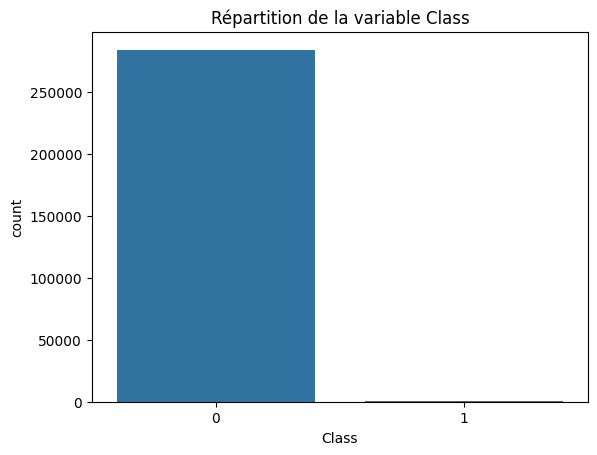

In [257]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.countplot(data=df, x='Class')
plt.title("Répartition de la variable Class")
plt.show()


### Répartition de la variable *Class*

Ce graphique montre la distribution des deux catégories de la variable **Class** :
- **0** : transactions normales
- **1** : transactions frauduleuses

On observe un **déséquilibre massif** : la grande majorité des transactions appartiennent à la classe normale, tandis que les transactions frauduleuses représentent une proportion extrêmement faible du dataset.  

Ce déséquilibre est un élément important à prendre en compte dans toute analyse ou modélisation future.


In [258]:
df['Amount'].describe()


count    284807.000000
mean         88.349619
std         250.120109
min           0.000000
25%           5.600000
50%          22.000000
75%          77.165000
max       25691.160000
Name: Amount, dtype: float64

##  Analyse du montant des transactions (Amount)

Les montants présentent :
- une moyenne relativement faible,
- un écart-type élevé,
- des valeurs extrêmes pouvant dépasser **25 000**.

Cela suggère la présence de nombreux **outliers**.


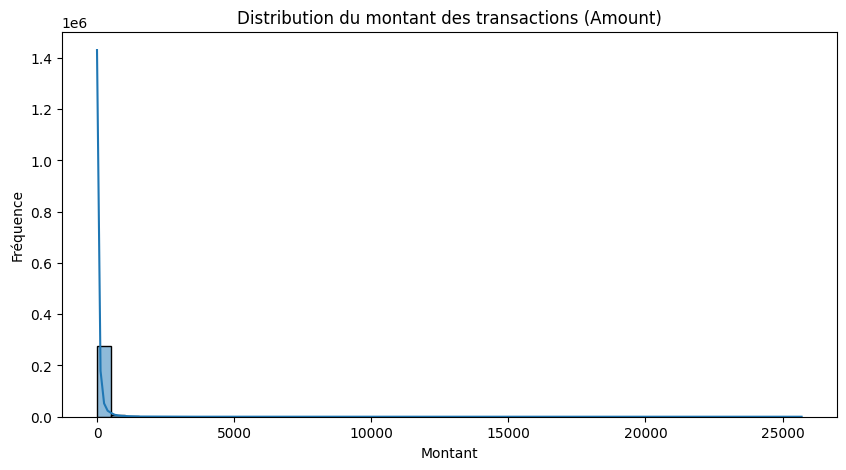

In [259]:
plt.figure(figsize=(10,5))
sns.histplot(df['Amount'], bins=50, kde=True)
plt.title("Distribution du montant des transactions (Amount)")
plt.xlabel("Montant")
plt.ylabel("Fréquence")
plt.show()


### Distribution du montant des transactions

La grande majorité des transactions ont un montant faible,  
tandis que quelques-unes présentent des montants très élevés, visibles sous forme d’outliers.


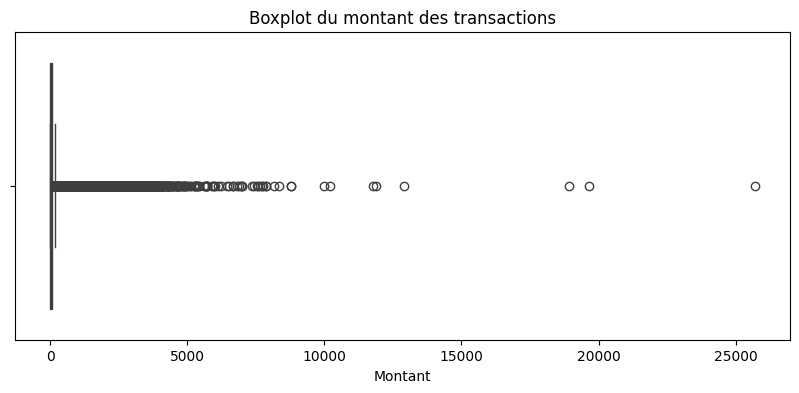

In [260]:
plt.figure(figsize=(10,4))
sns.boxplot(x=df['Amount'])
plt.title("Boxplot du montant des transactions")
plt.xlabel("Montant")
plt.show()


### Boxplot du montant

Le boxplot confirme la présence de nombreux outliers.  
Ce comportement est typique des données bancaires où certaines transactions sont exceptionnellement élevées.


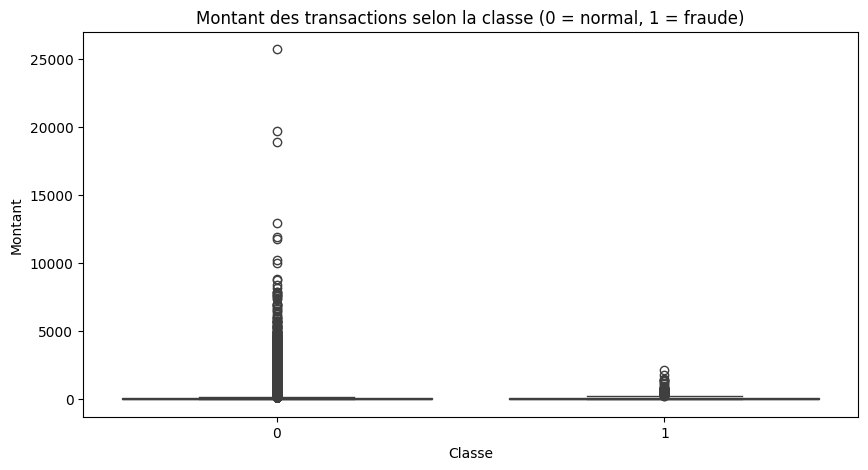

In [261]:
plt.figure(figsize=(10,5))
sns.boxplot(data=df, x='Class', y='Amount')
plt.title("Montant des transactions selon la classe (0 = normal, 1 = fraude)")
plt.xlabel("Classe")
plt.ylabel("Montant")
plt.show()


### Montant selon la classe

Les montants élevés ne sont pas propres aux fraudes :  
les deux classes contiennent des valeurs extrêmes.  
La fraude n’est donc pas directement corrélée au montant.


In [262]:
df['Time'].describe()


count    284807.000000
mean      94813.859575
std       47488.145955
min           0.000000
25%       54201.500000
50%       84692.000000
75%      139320.500000
max      172792.000000
Name: Time, dtype: float64

##  Analyse de la variable Time

La variable `Time` correspond au temps écoulé depuis la première transaction du dataset.  
Elle permet de repérer les périodes d’activité ou d’éventuelles tendances temporelles.


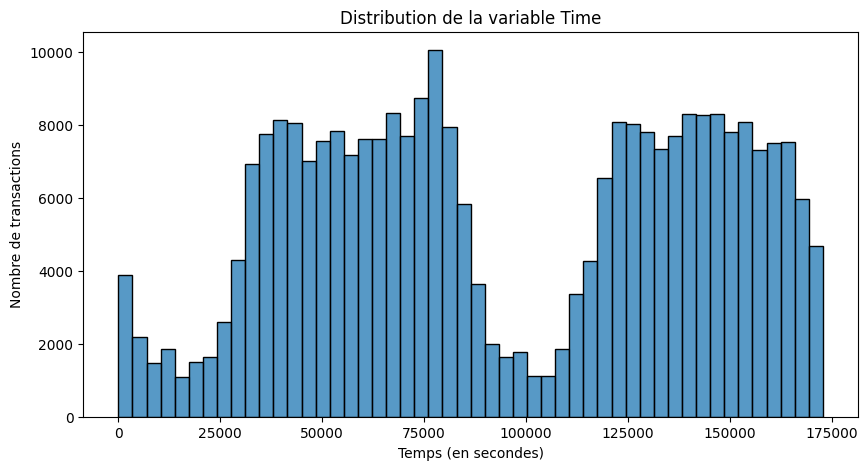

In [263]:
plt.figure(figsize=(10,5))
sns.histplot(df['Time'], bins=50, kde=False)
plt.title("Distribution de la variable Time")
plt.xlabel("Temps (en secondes)")
plt.ylabel("Nombre de transactions")
plt.show()


### Distribution temporelle des transactions

La distribution montre comment les transactions sont réparties dans le temps.  
Aucun motif particulier ne semble dominer.


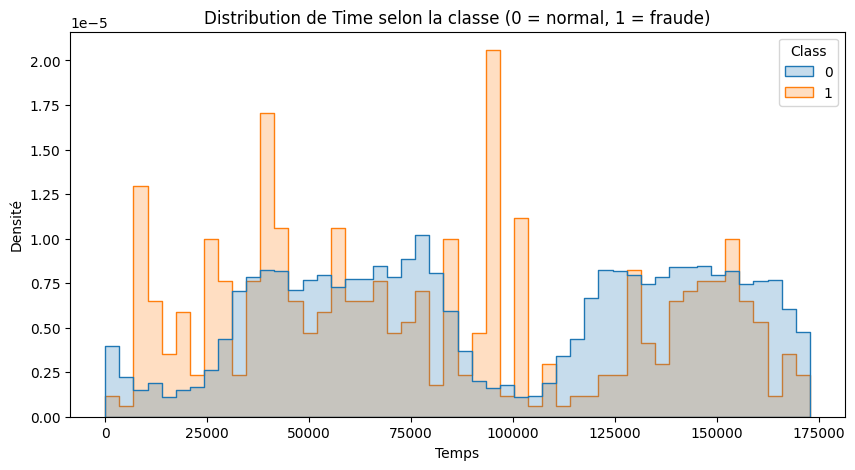

In [264]:
plt.figure(figsize=(10,5))
sns.histplot(data=df, x='Time', hue='Class', bins=50, element='step', stat='density', common_norm=False)
plt.title("Distribution de Time selon la classe (0 = normal, 1 = fraude)")
plt.xlabel("Temps")
plt.ylabel("Densité")
plt.show()


### Activité temporelle selon la classe

La distribution du temps pour les fraudes et transactions normales montre que :
- les fraudes surviennent à des moments variés,
- aucune plage temporelle spécifique ne semble plus propice à la fraude.


In [265]:
corr = df.corr()
corr


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
Time,1.000000,1.173963e-01,-1.059333e-02,-4.196182e-01,-1.052602e-01,1.730721e-01,-6.301647e-02,8.471437e-02,-3.694943e-02,-8.660434e-03,...,4.473573e-02,1.440591e-01,5.114236e-02,-1.618187e-02,-2.330828e-01,-4.140710e-02,-5.134591e-03,-9.412688e-03,-0.010596,-0.012323
V1,0.117396,1.000000e+00,4.135835e-16,-1.227819e-15,-9.215150e-16,1.812612e-17,-6.506567e-16,-1.005191e-15,-2.433822e-16,-1.513678e-16,...,-2.457409e-16,-4.290944e-16,6.168652e-16,-4.425156e-17,-9.605737e-16,-1.581290e-17,1.198124e-16,2.083082e-15,-0.227709,-0.101347
V2,-0.010593,4.135835e-16,1.000000e+00,3.243764e-16,-1.121065e-15,5.157519e-16,2.787346e-16,2.055934e-16,-5.377041e-17,1.978488e-17,...,-8.480447e-17,1.526333e-16,1.634231e-16,1.247925e-17,-4.478846e-16,2.057310e-16,-4.966953e-16,-5.093836e-16,-0.531409,0.091289
V3,-0.419618,-1.227819e-15,3.243764e-16,1.000000e+00,4.711293e-16,-6.539009e-17,1.627627e-15,4.895305e-16,-1.268779e-15,5.568367e-16,...,5.706192e-17,-1.133902e-15,-4.983035e-16,2.686834e-19,-1.104734e-15,-1.238062e-16,1.045747e-15,9.775546e-16,-0.210880,-0.192961
V4,-0.105260,-9.215150e-16,-1.121065e-15,4.711293e-16,1.000000e+00,-1.719944e-15,-7.491959e-16,-4.104503e-16,5.697192e-16,6.923247e-16,...,-1.949553e-16,-6.276051e-17,9.164206e-17,1.584638e-16,6.070716e-16,-4.247268e-16,3.977061e-17,-2.761403e-18,0.098732,0.133447
V5,0.173072,1.812612e-17,5.157519e-16,-6.539009e-17,-1.719944e-15,1.000000e+00,2.408382e-16,2.715541e-16,7.437229e-16,7.391702e-16,...,-3.920976e-16,1.253751e-16,-8.428683e-18,-1.149255e-15,4.808532e-16,4.319541e-16,6.590482e-16,-5.613951e-18,-0.386356,-0.094974
V6,-0.063016,-6.506567e-16,2.787346e-16,1.627627e-15,-7.491959e-16,2.408382e-16,1.000000e+00,1.191668e-16,-1.104219e-16,4.131207e-16,...,5.833316e-17,-4.705235e-19,1.046712e-16,-1.071589e-15,4.562861e-16,-1.357067e-16,-4.452461e-16,2.594754e-16,0.215981,-0.043643
V7,0.084714,-1.005191e-15,2.055934e-16,4.895305e-16,-4.104503e-16,2.715541e-16,1.191668e-16,1.000000e+00,3.344412e-16,1.122501e-15,...,-2.027779e-16,-8.898922e-16,-4.387401e-16,7.434913e-18,-3.094082e-16,-9.657637e-16,-1.782106e-15,-2.776530e-16,0.397311,-0.187257
V8,-0.036949,-2.433822e-16,-5.377041e-17,-1.268779e-15,5.697192e-16,7.437229e-16,-1.104219e-16,3.344412e-16,1.000000e+00,4.356078e-16,...,3.892798e-16,2.026927e-16,6.377260e-17,-1.047097e-16,-4.653279e-16,-1.727276e-16,1.299943e-16,-6.200930e-16,-0.103079,0.019875
V9,-0.008660,-1.513678e-16,1.978488e-17,5.568367e-16,6.923247e-16,7.391702e-16,4.131207e-16,1.122501e-15,4.356078e-16,1.000000e+00,...,1.936953e-16,-7.071869e-16,-5.214137e-16,-1.430343e-16,6.757763e-16,-7.888853e-16,-6.709655e-17,1.110541e-15,-0.044246,-0.097733


## Matrice de corrélation

Le calcul de la matrice de corrélation aide à observer les relations linéaires entre les variables.  
Les variables PCA sont peu corrélées entre elles, ce qui est cohérent avec leur construction.


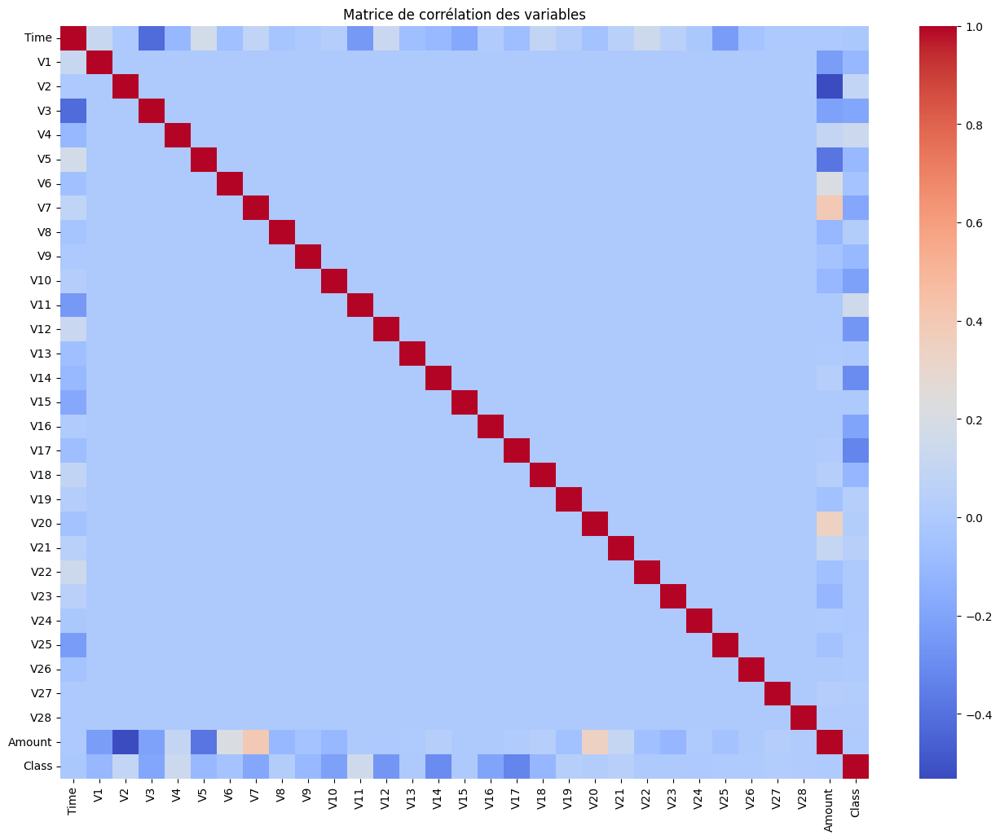

In [266]:
plt.figure(figsize=(16, 12))
sns.heatmap(corr, cmap='coolwarm', annot=False)
plt.title("Matrice de corrélation des variables")
plt.show()


### Visualisation de la matrice de corrélation

Cette heatmap permet d’identifier les variables potentiellement liées à la fraude.  
Certaines composantes (ex. V10, V12, V14, V17) montrent des corrélations intéressantes avec la variable `Class`.


In [267]:
corr_class = corr['Class'].sort_values(ascending=False)
corr_class


Class     1.000000
V11       0.154876
V4        0.133447
V2        0.091289
V21       0.040413
V19       0.034783
V20       0.020090
V8        0.019875
V27       0.017580
V28       0.009536
Amount    0.005632
V26       0.004455
V25       0.003308
V22       0.000805
V23      -0.002685
V15      -0.004223
V13      -0.004570
V24      -0.007221
Time     -0.012323
V6       -0.043643
V5       -0.094974
V9       -0.097733
V1       -0.101347
V18      -0.111485
V7       -0.187257
V3       -0.192961
V16      -0.196539
V10      -0.216883
V12      -0.260593
V14      -0.302544
V17      -0.326481
Name: Class, dtype: float64

### Corrélation des variables avec la classe *Class*

Ici, nous trions les coefficients de corrélation entre chaque variable du dataset et la variable cible **Class** (fraude ou non-fraude).  

Cela permet d’identifier quelles variables sont **les plus informatives** pour distinguer une transaction frauduleuse d’une transaction normale.  

Des valeurs de corrélation proches de **0** indiquent une relation faible, tandis que des valeurs plus éloignées de 0 (positives ou négatives) indiquent une relation plus forte.  

Dans ce dataset, certaines variables comme **V10, V12, V14** montrent souvent des corrélations plus importantes avec la fraude, ce qui les rend particulièrement intéressantes pour un futur modèle prédictif.


In [268]:
import plotly.express as px

fig = px.imshow(corr,
                labels=dict(color="Corrélation"),
                x=corr.columns,
                y=corr.columns,
                color_continuous_scale="RdBu_r")
fig.update_layout(title="Heatmap interactive des corrélations (Plotly)")
fig.show()


### Heatmap interactive des corrélations

Cette visualisation affiche la **matrice de corrélation** de l’ensemble des variables grâce à Plotly.  

L’objectif est d’identifier rapidement :
- quelles variables sont **fortement corrélées** entre elles,
- quelles variables présentent une corrélation intéressante avec **Class** (fraude),
- les relations positives (rouge) et négatives (bleu).

L’interactivité de Plotly permet de zoomer, survoler les cellules et observer précisément la valeur de chaque corrélation. Cela rend l’analyse plus intuitive qu'une heatmap statique.


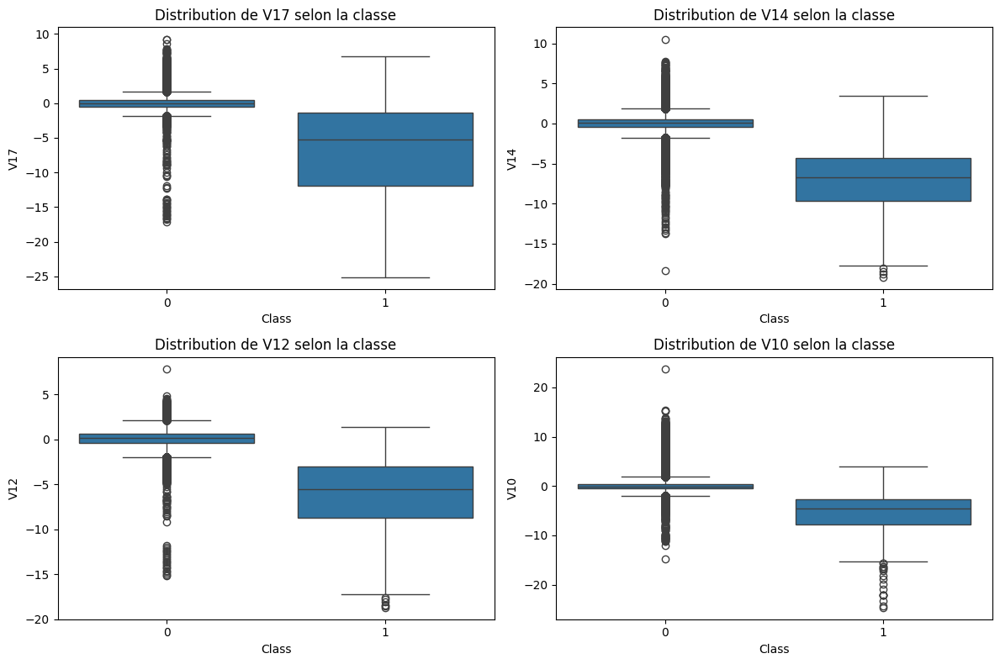

In [269]:
import matplotlib.pyplot as plt
import seaborn as sns

important_vars = ['V17', 'V14', 'V12', 'V10']

plt.figure(figsize=(12,8))
for i, col in enumerate(important_vars, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(data=df, x='Class', y=col)
    plt.title(f"Distribution de {col} selon la classe")
plt.tight_layout()
plt.show()


### Analyse des variables les plus corrélées avec la fraude

Les variables **V17**, **V14**, **V12** et **V10** font partie des composantes PCA présentant les corrélations les plus fortes avec la variable cible **Class**.  
Ces variables sont donc particulièrement importantes pour comprendre les comportements associés aux transactions frauduleuses.

Le boxplot permet de visualiser la distribution de chaque variable pour :
- **Class = 0** : transactions normales  
- **Class = 1** : transactions frauduleuses  

### Observations typiques :
- Certaines variables présentent des valeurs nettement différentes pour les fraudes.
- Les distributions montrent que les fraudes ont souvent des valeurs **plus extrêmes** sur ces composantes.
- Ces différences sont utiles pour une future modélisation, car elles permettent de distinguer les fraudes des transactions normales.

Cette visualisation confirme que ces variables PCA jouent un rôle central dans la détection de fraude.


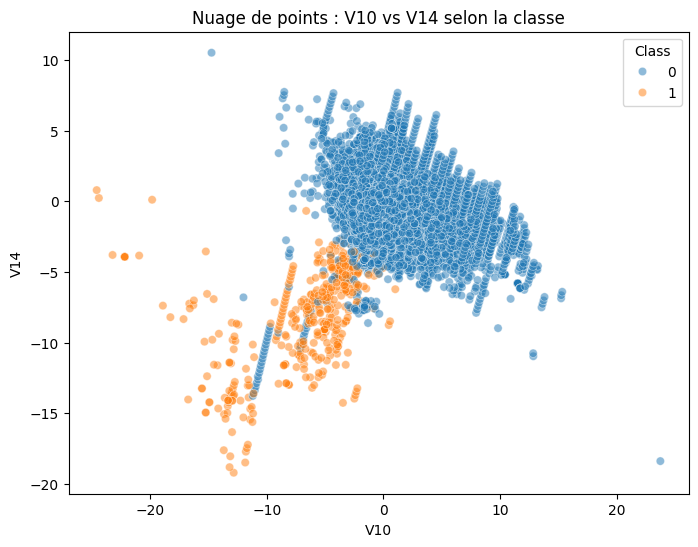

In [270]:
plt.figure(figsize=(8,6))
sns.scatterplot(data=df, x='V10', y='V14', hue='Class', alpha=0.5)
plt.title("Nuage de points : V10 vs V14 selon la classe")
plt.show()


### Relation entre V10 et V14 selon la classe

Ce nuage de points représente la relation entre les deux variables **V10** et **V14**, deux composantes PCA fortement corrélées avec la variable cible *Class*.  

En colorant les points selon la classe (0 = normal, 1 = fraude), on peut observer :

- Une séparation partielle entre les deux classes dans l’espace formé par V10 et V14.
- Les transactions frauduleuses (points en rouge) ont tendance à se regrouper dans des zones spécifiques du graphique.
- Les transactions normales sont beaucoup plus dispersées.

### Intérêt de ce graphique :
Cette visualisation montre que certaines combinaisons linéaires des variables d’origine (issues de la PCA) permettent de mieux distinguer la fraude, ce qui est essentiel pour un futur modèle de classification.

Elle illustre aussi le potentiel des méthodes d'apprentissage supervisé à exploiter ces patterns pour identifier les fraudes plus efficacement.


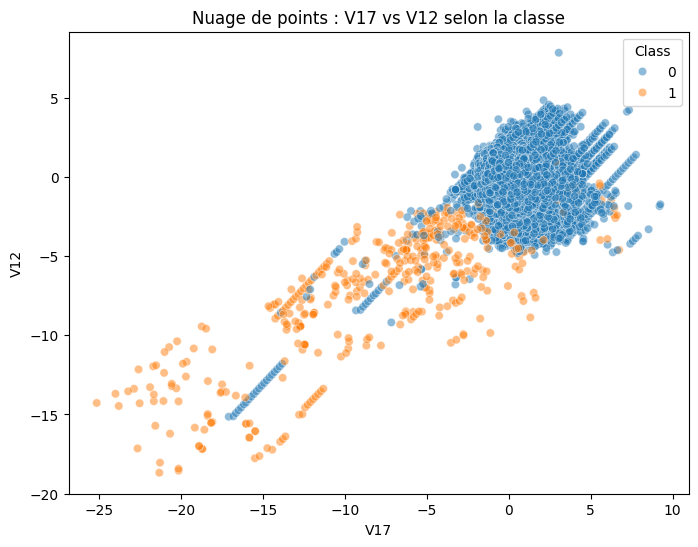

In [271]:
plt.figure(figsize=(8,6))
sns.scatterplot(data=df, x='V17', y='V12', hue='Class', alpha=0.5)
plt.title("Nuage de points : V17 vs V12 selon la classe")
plt.show()


### Relation entre V17 et V12 selon la classe

Ce nuage de points permet de visualiser la relation entre deux variables fortement corrélées à la fraude : **V17** et **V12**.

En distinguant les points selon la classe :
- **Class = 0** : transactions normales  
- **Class = 1** : transactions frauduleuses  

on observe :

- Un regroupement particulier des transactions frauduleuses dans certaines zones du graphique.
- Les transactions normales apparaissent plus dispersées dans l’espace formé par V17 et V12.
- Les comportements extrêmes de certaines observations indiquent que ces composantes PCA capturent des patterns utiles pour la détection de fraude.

###  Interprétation :
Bien que les variables soient issues d’une transformation PCA (donc non directement interprétables), leur combinaison révèle des structures distinctes entre fraudes et non-fraudes.  
Cela renforce l’idée que ces variables seront très pertinentes pour un modèle de classification.


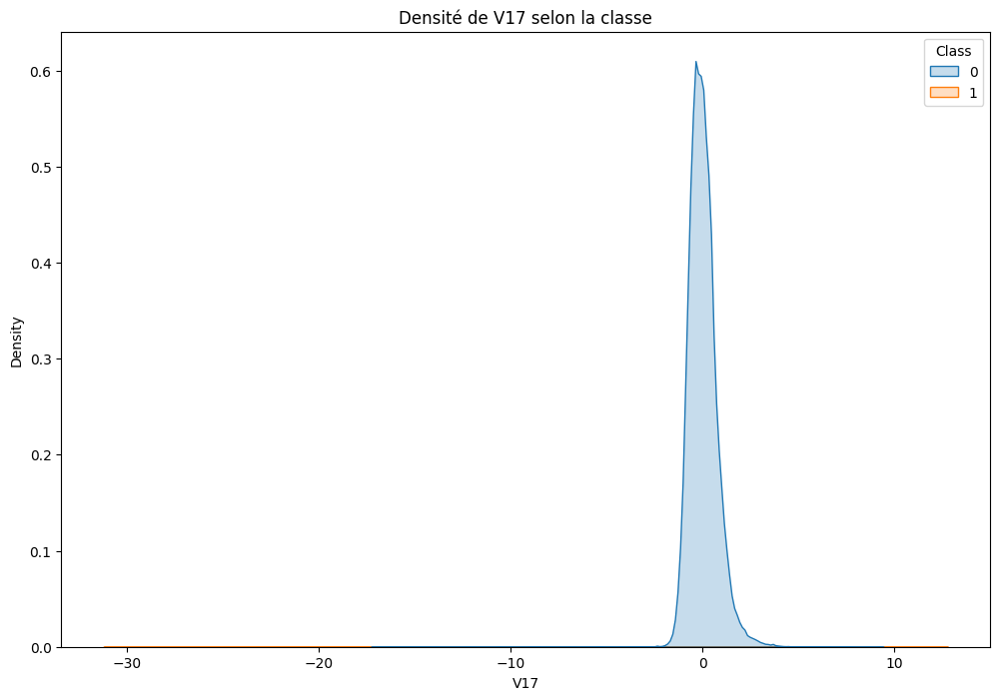

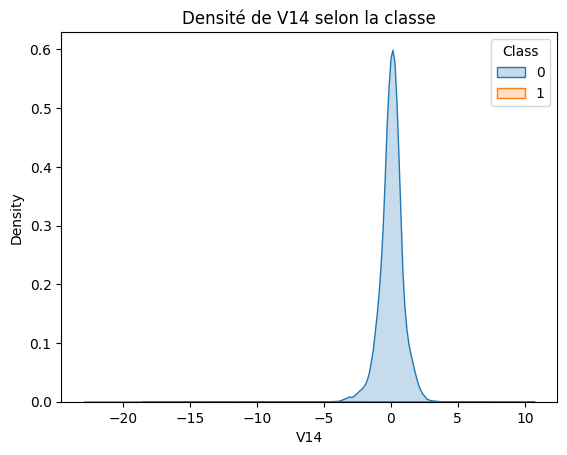

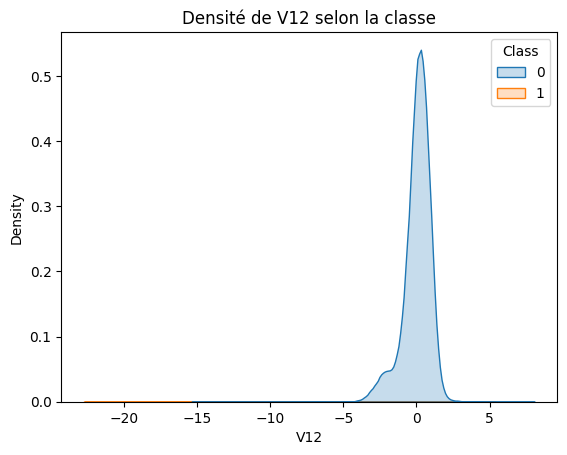

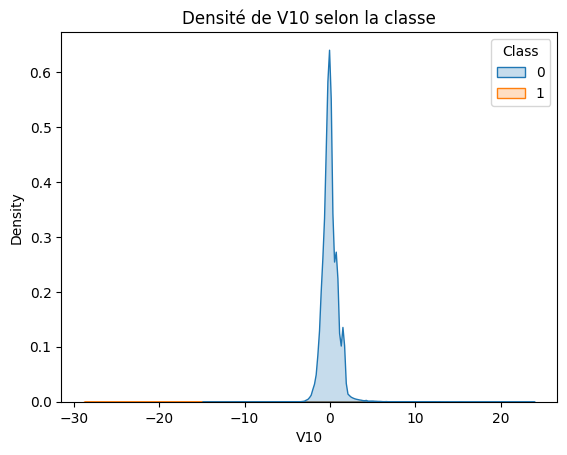

In [272]:
plt.figure(figsize=(12,8))
for col in important_vars:
    sns.kdeplot(data=df, x=col, hue='Class', fill=True)
    plt.title(f"Densité de {col} selon la classe")
    plt.show()


### Densité des variables les plus corrélées selon la classe

Cette série de graphiques montre la **densité des variables V17, V14, V12 et V10** pour chacune des deux classes :
- **Class = 0** : transactions normales  
- **Class = 1** : transactions frauduleuses  

###  Ce que montrent les courbes de densité :
- Les distributions des fraudes et des transactions normales **ne se superposent pas totalement**.
- Pour certaines variables, comme **V17** ou **V14**, les valeurs associées aux fraudes se concentrent dans des zones spécifiques.
- On observe des **différences nettes de forme et d’amplitude** entre les classes, ce qui confirme l’importance de ces variables dans la détection de fraude.

###  Intérêt de cette visualisation :
Les courbes de densité permettent de :
- Voir les différences de comportement entre les classes,
- Mieux comprendre la structure des variables,
- Identifier des patterns exploitables pour un modèle prédictif.

Ces observations renforcent le rôle clé des variables PCA les plus corrélées dans l’analyse et la modélisation de la fraude bancaire.


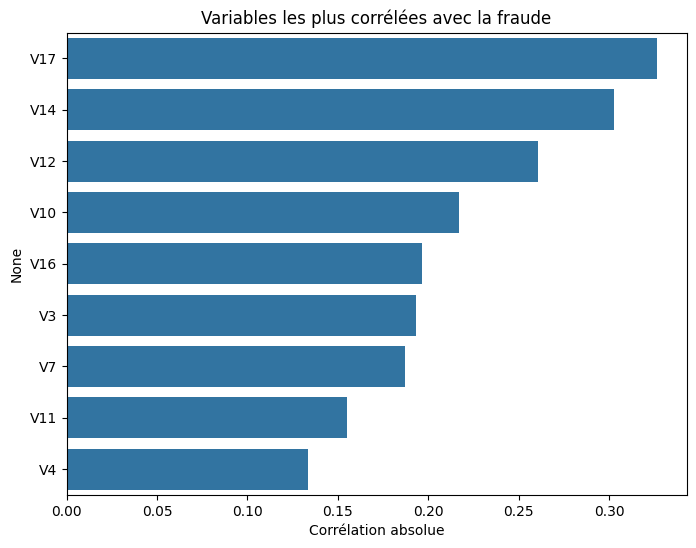

In [273]:
corr_class = corr['Class'].abs().sort_values(ascending=False)[1:10]

plt.figure(figsize=(8,6))
sns.barplot(x=corr_class.values, y=corr_class.index)
plt.title("Variables les plus corrélées avec la fraude")
plt.xlabel("Corrélation absolue")
plt.show()


### Variables les plus corrélées avec la fraude

Ce graphique présente les **10 variables ayant la plus forte corrélation absolue** avec la variable cible *Class*, à l’exception de Class elle-même (exclue automatiquement).

### Pourquoi regarder la corrélation absolue ?
La corrélation peut être :
- **positive** → les valeurs augmentent ensemble,
- **négative** → les valeurs évoluent en sens opposé.

Dans les deux cas, une corrélation forte indique que la variable contient **une information utile pour distinguer fraude et non-fraude**.  
En prenant la valeur absolue, on met en avant la *force* de la relation, peu importe le sens.

###  Interprétation :
- Certaines variables comme **V10**, **V12**, **V14**, **V17**, etc., ressortent souvent comme étant les plus informatives.
- Ces composantes PCA capturent des patterns particuliers observés dans les transactions frauduleuses.
- Elles seront donc très importantes dans un éventuel modèle prédictif.

Ce tableau permet d’identifier rapidement quelles variables méritent une analyse plus poussée.


In [274]:
import plotly.express as px

fig = px.histogram(
    df,
    x="Amount",
    color="Class",
    nbins=50,
    barmode="overlay",
    opacity=0.7,
    title="Distribution interactive du montant des transactions selon la classe"
)
fig.update_xaxes(title="Montant")
fig.update_yaxes(title="Nombre de transactions")
fig.show()


### Distribution du montant des transactions selon la classe

Cet histogramme interactif affiche la distribution de la variable **Amount** (montant des transactions) en distinguant :
- les transactions normales (Class = 0)
- les transactions frauduleuses (Class = 1)

###  Observations :
- La plupart des transactions ont un **montant faible**, même pour la classe 0.
- Les transactions frauduleuses (en rouge) présentent souvent une distribution différente, avec des pics dans certaines zones.
- Le chevauchement des courbes permet d’identifier les montants où les fraudes sont proportionnellement plus fréquentes.

###  Intérêt du graphique :
- Visualiser les différences entre les deux classes sur une variable clé : **le montant**.
- Repérer les zones où la fraude apparaît plus souvent.
- L’interactivité Plotly permet d’explorer les valeurs exactes et d’obtenir une meilleure compréhension de la structure du dataset.

Ce graphique est essentiel car le montant est l'une des variables les plus intuitives à analyser dans un contexte de fraude bancaire.


In [275]:
fig = px.box(
    df,
    x="Class",
    y="Amount",
    points="all",
    title="Montant des transactions par classe (boxplot interactif)"
)
fig.update_xaxes(title="Classe (0 = normal, 1 = fraude)")
fig.update_yaxes(title="Montant")
fig.show()


### Boxplot interactif du montant selon la classe

Ce boxplot compare la distribution du **montant des transactions (Amount)** pour les deux classes :
- **Classe 0 :** transactions normales  
- **Classe 1 :** transactions frauduleuses  

### Ce que montre le graphique :
- Les transactions frauduleuses présentent souvent des montants plus variables et parfois plus élevés.
- Les valeurs extrêmes (outliers) sont plus visibles grâce à l'affichage des points individuels.
- Le boxplot met en évidence la différence de dispersion et de médiane entre les deux classes.

###  Pourquoi ce graphique est utile ?
- Il permet de voir si la variable *Amount* peut aider à distinguer une fraude d’une transaction normale.
- Il révèle la présence de valeurs atypiques, importantes pour la détection de fraude.
- L'interactivité de Plotly facilite l’exploration des points extrêmes.

Ce graphique est essentiel pour comprendre comment le montant est distribué dans chaque catégorie et comment il influence le comportement frauduleux.


In [276]:
fig = px.scatter(
    df.sample(10000, random_state=42),  # on échantillonne pour ne pas surcharger
    x="Time",
    y="Amount",
    color="Class",
    title="Montant des transactions en fonction du temps (échantillon)"
)
fig.update_xaxes(title="Temps (en secondes depuis le début)")
fig.update_yaxes(title="Montant")
fig.show()


### Montant des transactions en fonction du temps

Ce graphique montre la relation entre le **temps (`Time`)** et le **montant (`Amount`)** des transactions, en distinguant les fraudes et les transactions normales.  
Un échantillon de 10 000 lignes est utilisé pour éviter une surcharge graphique et accélérer l'affichage.

### Observations possibles :
- Les transactions normales (classe 0) sont largement majoritaires et réparties sur toute la durée.
- Les transactions frauduleuses (classe 1) apparaissent comme des points colorés isolés.
- Certaines fraudes semblent regrouper des montants spécifiques ou apparaître à des moments particuliers.

###  Pourquoi cette visualisation est importante ?
- Elle permet de détecter l’existence éventuelle de **patterns temporels** dans les fraudes.
- Elle montre comment le montant varie au fil du temps.
- Elle donne un premier aperçu de l’évolution des transactions sur la période analysée.

Même si aucune tendance forte n’est directement visible, ce type de graphique aide à identifier des comportements anormaux potentiels.


In [277]:
fig = px.histogram(
    df,
    x="Time",
    nbins=100,
    title="Distribution interactive de la variable Time"
)
fig.update_xaxes(title="Temps (en secondes)")
fig.update_yaxes(title="Nombre de transactions")
fig.show()


### Distribution de la variable *Time*

Cet histogramme interactif représente la distribution de la variable **Time**, qui correspond au nombre de secondes écoulées depuis la première transaction du dataset.

###  Ce que permet d’observer ce graphique :
- La fréquence des transactions tout au long de la période analysée.
- La présence éventuelle de pics d’activité (heures plus actives).
- Une vue d’ensemble du volume des transactions en fonction du temps.

###  Intérêt de cette analyse :
- Comprendre la dynamique temporelle des transactions bancaires.
- Identifier des périodes avec un comportement inhabituel ou des irrégularités potentielles.
- Préparer des analyses plus fines comme la détection de patterns temporels ou la segmentation horaire.

Même si la variable *Time* ne montre pas toujours une structure claire, elle reste utile pour analyser le rythme global des transactions.
